In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler, StandardScaler

import data_processing
import feature_extraction

In [2]:
feature_df = pd.read_csv("mode_classification_features.csv")

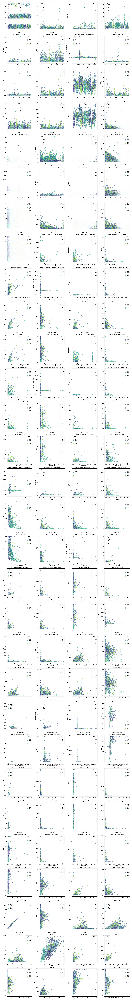

In [3]:
features = [col for col in feature_df.columns if col not in ['label', 'trajectory']]


# Define number of columns per row
cols_per_row = 4  # Change this value to control the layout
num_plots = len(features) * (len(features) - 1) // 2  # Number of unique feature pairs
rows = (num_plots + cols_per_row - 1) // cols_per_row  # Calculate required rows

# Create subplots with controlled layout
fig, axes = plt.subplots(rows, cols_per_row, figsize=(5 * cols_per_row, 5 * rows))
axes = axes.flatten()  # Flatten the axes array for easy indexing

# Loop through unique feature pairs and plot
plot_idx = 0
for i in range(len(features)):
    for j in range(i + 1, len(features)):  # Ensure unique pairs
        feature1 = features[i]
        feature2 = features[j]

        # Scatter plot
        sns.scatterplot(ax=axes[plot_idx], data=feature_df, x=feature1, y=feature2, hue=feature_df['label'], palette='viridis', alpha=0.7)

        # Set plot titles
        axes[plot_idx].set_title(f"{feature1} vs {feature2}")

        plot_idx += 1

# Remove empty subplots (if any)
for i in range(plot_idx, len(axes)):
    fig.delaxes(axes[i])

# Adjust layout
plt.tight_layout()
plt.show()

In [ ]:
# Normalize data using Min-Max Scaling or Standardization
scaler = MinMaxScaler()  # Alternative: StandardScaler()
feature_df[features] = scaler.fit_transform(feature_df[features])  # Normalize only feature columns

# Define number of columns per row
cols_per_row = 5  # Change this value to control the layout
num_plots = len(features) * (len(features) - 1) // 2  # Number of unique feature pairs
rows = (num_plots + cols_per_row - 1) // cols_per_row  # Calculate required rows

# Create subplots with controlled layout
fig, axes = plt.subplots(rows, cols_per_row, figsize=(5 * cols_per_row, 5 * rows))

# Ensure axes is always iterable
if num_plots == 1:
    axes = [axes]  # Convert single object to list
else:
    axes = axes.flatten()

# Loop through unique feature pairs and plot
plot_idx = 0
for i in range(len(features)):
    for j in range(i + 1, len(features)):  # Ensure unique pairs
        feature1 = features[i]
        feature2 = features[j]

        # Scatter plot
        sns.scatterplot(ax=axes[plot_idx], data=feature_df, x=feature1, y=feature2, hue=feature_df['label'], palette='viridis', alpha=0.7)

        # Set plot titles
        axes[plot_idx].set_title(f"{feature1} vs {feature2}")

        plot_idx += 1

# Remove empty subplots (if any)
for i in range(plot_idx, len(axes)):
    fig.delaxes(axes[i])

# Adjust layout
plt.tight_layout()
plt.show()

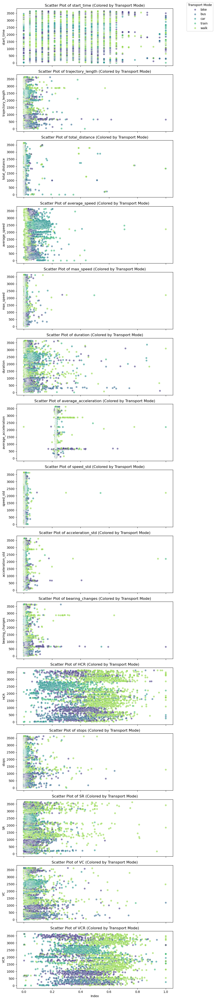

In [14]:
# Create multiple scatter plots, one for each feature
num_features = len(features)
fig, axes = plt.subplots(nrows=num_features, figsize=(8, 3 * num_features), sharex=True)

# Loop through each feature and create a scatter plot
for i, feature in enumerate(features):
    sns.scatterplot(ax=axes[i], x=np.arange(len(feature_df)), y=feature_df[feature], hue=feature_df["label"], alpha=0.6, palette="viridis")
    axes[i].set_ylabel(feature)
    axes[i].set_xlabel("Index")
    axes[i].set_title(f"Scatter Plot of {feature} (Colored by Transport Mode)")
    axes[i].legend_.remove()  # Remove legend from individual plots

# Adjust layout and add a single legend for the whole figure
plt.tight_layout()
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, title="Transport Mode", bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()



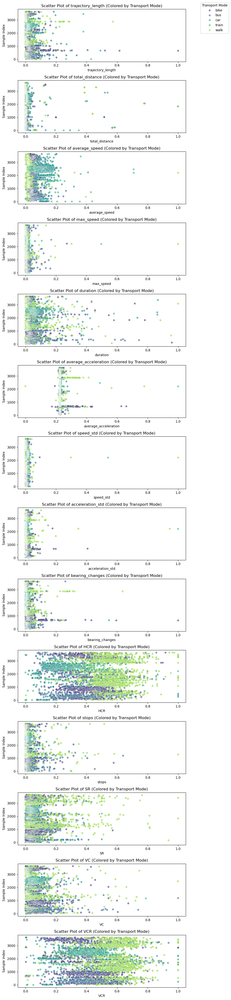

In [23]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Convert 'label' to categorical type
feature_df['label'] = feature_df['label'].astype('category')

# Select numerical features (excluding 'trajectory' and 'start_time')
features = [col for col in feature_df.columns if col not in ['label', 'trajectory', 'start_time']]

# Normalize numerical features
scaler = MinMaxScaler()
feature_df[features] = scaler.fit_transform(feature_df[features])

# Create multiple scatter plots, one for each feature
num_features = len(features)
fig, axes = plt.subplots(nrows=num_features, figsize=(8, 3 * num_features), sharey=True)

# Loop through each feature and create a scatter plot
for i, feature in enumerate(features):
    sns.scatterplot(ax=axes[i], x=feature_df[feature], y=np.arange(len(feature_df)), hue=feature_df["label"], alpha=0.6, palette="viridis")
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel("Sample Index")
    axes[i].set_title(f"Scatter Plot of {feature} (Colored by Transport Mode)")
    axes[i].legend_.remove()  # Remove legend from individual plots

# Adjust layout and add a single legend for the whole figure
plt.tight_layout()
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, title="Transport Mode", bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()


/opt/anaconda3/lib/python3.12/site-packages/seaborn/categorical.py:3399: UserWarning: 39.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.12/site-packages/seaborn/categorical.py:3399: UserWarning: 64.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.12/site-packages/seaborn/categorical.py:3399: UserWarning: 64.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.12/site-packages/seaborn/categorical.py:3399: UserWarning: 26.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.12/site-packages/seaborn/categorical.py:3399: UserWarning: 67.6% of the p

<Axes: xlabel='SR', ylabel='label'>

/opt/anaconda3/lib/python3.12/site-packages/seaborn/categorical.py:3399: UserWarning: 44.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.12/site-packages/seaborn/categorical.py:3399: UserWarning: 67.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.12/site-packages/seaborn/categorical.py:3399: UserWarning: 67.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.12/site-packages/seaborn/categorical.py:3399: UserWarning: 31.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.12/site-packages/seaborn/categorical.py:3399: UserWarning: 70.7% of the p

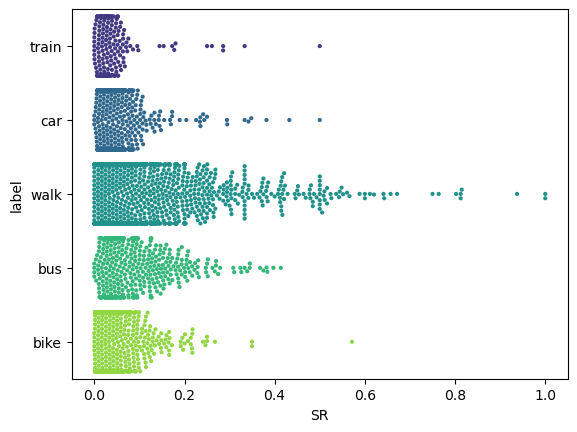

In [18]:
feature= 'SR'
sns.swarmplot(x=feature_df[feature], y=feature_df['label'], hue=feature_df["label"], palette="viridis", size=3)


<Axes: xlabel='SR', ylabel='label'>

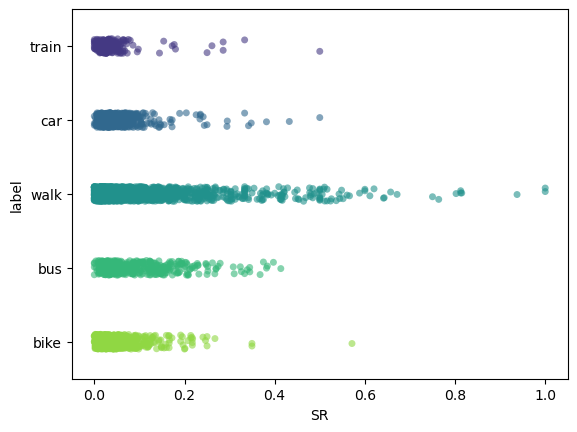

In [20]:
sns.stripplot(x=feature_df[feature], y=feature_df['label'], hue=feature_df["label"], jitter=True, alpha=0.6, palette="viridis")